In [ ]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, utils
from torchvision.models import inception_v3, Inception_V3_Weights
from PIL import Image
import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
import random
import numpy as np
from google.colab import drive
from scipy import linalg
import copy

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def seed_everything(seed=2025):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True

In [ ]:
class SimpleImageFolder(Dataset):
    def __init__(self, folder_path, image_size):
        self.image_paths = sorted(glob.glob(os.path.join(folder_path, "**", "*.png"), recursive=True))
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),  # 直接 resize 成固定大小
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        return self.transform(img), 0

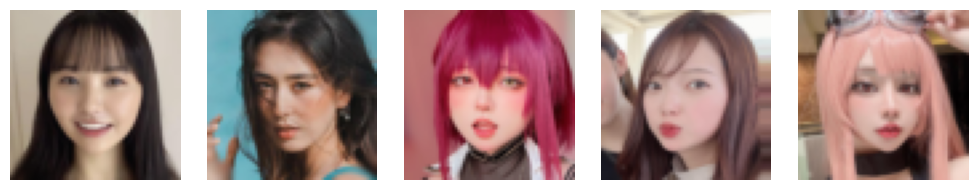

In [ ]:
# 顯示前 N 張 resize 過後的圖片
def show_resized_samples(dataset_path, image_size=64, num_samples=5):
    dataset = SimpleImageFolder(dataset_path, image_size)
    plt.figure(figsize=(num_samples * 2, 2))
    for i in range(num_samples):
        img_tensor, _ = dataset[i]
        img = img_tensor.permute(1, 2, 0).cpu().numpy()  # (C,H,W) -> (H,W,C)
        img = (img * 0.5 + 0.5).clip(0, 1)  # unnormalize 回到 [0,1]
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# 執行
import shutil
preview_dir = "/content/tmp_preview/"  # ← 最後一個斜線有時會導致某些 glob 寫法失效
if os.path.exists(preview_dir):
    shutil.rmtree(preview_dir)
os.makedirs(preview_dir, exist_ok=True)

for i, path in enumerate(sorted(glob.glob("/content/drive/MyDrive/positioned_faces/alldata/*.png"))[15:20]):
    shutil.copy(path, os.path.join(preview_dir, f"{i:03d}.png"))

show_resized_samples(preview_dir, image_size=64)

In [ ]:
# ========== 模型定義 ==========
class SelfAttention(nn.Module):
    def __init__(self, channels, size):
        super().__init__()
        self.channels = channels
        self.size = size
        self.mha = nn.MultiheadAttention(channels, 4, batch_first=True)
        self.ln = nn.LayerNorm([channels])
        self.ff_self = nn.Sequential(
            nn.LayerNorm([channels]),
            nn.Linear(channels, channels),
            nn.GELU(),
            nn.Linear(channels, channels),
        )

    def forward(self, x):
        x = x.view(-1, self.channels, self.size * self.size).swapaxes(1, 2)
        x_ln = self.ln(x)
        attention_value, _ = self.mha(x_ln, x_ln, x_ln)
        attention_value = attention_value + x
        attention_value = self.ff_self(attention_value) + attention_value
        return attention_value.swapaxes(2, 1).view(-1, self.channels, self.size, self.size)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, residual=False):
        super().__init__()
        self.residual = residual
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, 3, padding=1, bias=False),
            nn.GroupNorm(1, mid_channels),
            nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, 3, padding=1, bias=False),
            nn.GroupNorm(1, out_channels),
        )

    def forward(self, x):
        if self.residual:
            return F.gelu(x + self.double_conv(x))
        else:
            return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels),
        )
        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(emb_dim, out_channels)
        )

    def forward(self, x, t):
        x = self.maxpool_conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[2], x.shape[3])
        return x + emb

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv = nn.Sequential(
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels, in_channels // 2),
        )
        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(emb_dim, out_channels)
        )

    def forward(self, x, skip_x, t):
        x = self.up(x)
        x = torch.cat([skip_x, x], dim=1)
        x = self.conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[2], x.shape[3])
        return x + emb


In [ ]:
class StrongerUNet(nn.Module):
    def __init__(self, c_in=3, c_out=3, time_dim=256, device="cuda"):
        super().__init__()
        self.device = device
        self.time_dim = time_dim

        self.inc = DoubleConv(c_in, 128)  # 原本64，擴大初始通道

        self.down1 = Down(128, 256)
        self.sa1 = SelfAttention(256,32)

        self.down2 = Down(256, 384)
        self.sa2 = SelfAttention(384,16)

        self.down3 = Down(384, 512)
        self.sa3 = SelfAttention(512,8)

        self.bot1 = DoubleConv(512, 768)
        self.bot2 = DoubleConv(768, 768)
        self.bot3 = DoubleConv(768, 512)

        self.up1 = Up(896, 384)
        self.sa4 = SelfAttention(384, 16)

        self.up2 = Up(640, 256)
        self.sa5 = SelfAttention(256, 32)

        self.up3 = Up(384, 128)
        self.sa6 = SelfAttention(128, 64)

        self.outc = nn.Conv2d(128, c_out, kernel_size=1)

    def pos_encoding(self, t, channels):
        inv_freq = 1.0 / (10000 ** (torch.arange(0, channels, 2, device=self.device).float() / channels))
        pos_enc_a = torch.sin(t.repeat(1, channels // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels // 2) * inv_freq)
        return torch.cat([pos_enc_a, pos_enc_b], dim=-1)

    def forward(self, x, t):
        t = t.unsqueeze(-1).float()
        t = self.pos_encoding(t, self.time_dim)

        x1 = self.inc(x)
        x2 = self.down1(x1, t)
        x2 = self.sa1(x2)

        x3 = self.down2(x2, t)
        x3 = self.sa2(x3)

        x4 = self.down3(x3, t)
        x4 = self.sa3(x4)

        x4 = self.bot1(x4)
        x4 = self.bot2(x4)
        x4 = self.bot3(x4)

        x = self.up1(x4, x3, t)
        x = self.sa4(x)
        x = self.up2(x, x2, t)
        x = self.sa5(x)
        x = self.up3(x, x1, t)
        x = self.sa6(x)

        return self.outc(x)


In [ ]:
# ========== Diffusion ==========
class Diffusion:
    def __init__(self, noise_steps=1000, beta_start=1e-4, beta_end=0.02, img_size=64, device="cuda"):
        self.noise_steps = noise_steps
        self.beta = torch.linspace(beta_start, beta_end, noise_steps).to(device)
        self.alpha = 1. - self.beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)
        self.img_size = img_size
        self.device = device

    def noise_images(self, x, t):
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None]
        epsilon = torch.randn_like(x)
        return sqrt_alpha_hat * x + sqrt_one_minus_alpha_hat * epsilon, epsilon

    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,)).to(self.device)

    def sample(self, model, n, seed=2025):
        model.eval()
        x = torch.randn((n, 3, self.img_size, self.img_size)).to(self.device)
        for i in tqdm(reversed(range(1, self.noise_steps)), desc='Sampling'):
            t = torch.full((n,), i, device=self.device, dtype=torch.long)
            predicted_noise = model(x, t)
            alpha = self.alpha[t][:, None, None, None]
            alpha_hat = self.alpha_hat[t][:, None, None, None]
            beta = self.beta[t][:, None, None, None]
            noise = torch.randn_like(x) if i > 1 else torch.zeros_like(x)
            x = (1 / torch.sqrt(alpha)) * (x - ((1 - alpha) / torch.sqrt(1 - alpha_hat)) * predicted_noise) + torch.sqrt(beta) * noise
        x = (x.clamp(-1, 1) + 1) / 2
        return x

In [ ]:
# ========== Save Sample Images ==========
def save_images(images, path, nrow=4):
    from torchvision.utils import make_grid
    grid = make_grid(images, nrow=nrow)
    ndarr = grid.permute(1, 2, 0).cpu().numpy()
    im = Image.fromarray((ndarr * 255).astype('uint8'))
    os.makedirs(os.path.dirname(path), exist_ok=True)
    im.save(path)

## 訓練

In [ ]:
class EMA:
    def __init__(self, beta):
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(current_model.parameters(), ma_model.parameters()):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=100):
        if self.step == 0:
        # 第一步先對齊一次參數
            print("[EMA] Initializing EMA model parameters.")
            self.reset_parameters(ema_model, model)
        elif self.step >= step_start_ema:
        # 之後才開始 EMA 平滑更新
            self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR
def debug_sample(model, diffusion, dataset, device="cuda"):
    model.eval()
    img, _ = dataset[0]
    img = img.unsqueeze(0).to(device)

    t = diffusion.sample_timesteps(1)
    x_t, noise = diffusion.noise_images(img, t)
    predicted = model(x_t, t)

    alpha = diffusion.alpha[t][:, None, None, None]
    alpha_hat = diffusion.alpha_hat[t][:, None, None, None]
    x_denoised = (1 / torch.sqrt(alpha)) * (
        x_t - ((1 - alpha) / torch.sqrt(1 - alpha_hat)) * predicted
    )

    x_denoised = x_denoised.clamp(-1, 1).cpu()
    x_denoised = (x_denoised + 1) / 2
    x_t = (x_t.cpu() + 1) / 2

    print(f"[DEBUG] timestep: {t.item()}")
    print(f"[INFO] x_t range: {x_t.min().item():.4f} ~ {x_t.max().item():.4f}")
    print(f"[INFO] predicted noise mean: {predicted.mean().item():.4f}, std: {predicted.std().item():.4f}")
    print(f"[INFO] x_denoised range: {x_denoised.min().item():.4f} ~ {x_denoised.max().item():.4f}")

def train_model(run_name, dataset_path, image_size=64, batch_size=16, epochs=5, lr=3e-4,
                device="cuda", seed=2025, noise_steps=1000, beta_start=1e-4, beta_end=0.02,
                save_every=5):
    rgb_means = []  # 新增一個列表來儲存每個 epoch 的 RGB mean
    seed_everything(seed)
    dataset = SimpleImageFolder(dataset_path, image_size)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

    model = StrongerUNet(device=device).to(device)
    diffusion = Diffusion(noise_steps=noise_steps, beta_start=beta_start, beta_end=beta_end,
                          img_size=image_size, device=device)
    ema = EMA(0.998)
    ema_model = copy.deepcopy(model).eval().requires_grad_(False)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    scheduler = CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-5)

    mse = nn.MSELoss()

    os.makedirs(f"models/{run_name}", exist_ok=True)
    os.makedirs(f"results/{run_name}", exist_ok=True)

    num_batches_for_ema = 3

    train_losses = []
    ema_losses = []
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}")
        model.train()
        epoch_loss = 0
        pbar = tqdm(dataloader)

        last_x_t, last_t, last_noise = [], [], []  # 初始化暫存
        for i, (images, _) in enumerate(pbar):
            images = images.to(device)
            t = diffusion.sample_timesteps(images.size(0))
            x_t, noise = diffusion.noise_images(images, t)

            predicted = model(x_t, t)
            loss = mse(predicted, noise)

            # 不使用 AMP，直接反向與更新
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            ema.step_ema(ema_model, model)

            epoch_loss += loss.item()
            if i >= len(dataloader) - num_batches_for_ema:
                last_x_t.append(x_t.detach())
                last_t.append(t.detach())
                last_noise.append(noise.detach())

            pbar.set_postfix(MSE=loss.item())

        avg_loss = epoch_loss / len(dataloader)
        train_losses.append(avg_loss)  # 加到列表中
        print(f"✅ Epoch {epoch+1} 平均 Loss: {avg_loss:.4f}")
        scheduler.step()
        print(f"[INFO] Learning rate: {scheduler.get_last_lr()[0]:.6f}")

        ema_model.eval()
        ema_loss_total = 0
        with torch.no_grad():
            for xti, ti, nsei in zip(last_x_t, last_t, last_noise):
                ema_pred = ema_model(xti, ti)
                ema_loss_total += mse(ema_pred, nsei).item()
        ema_loss = ema_loss_total / num_batches_for_ema
        ema_losses.append(ema_loss)
        print(f"EMA Loss: {ema_loss:.4f}")
        del last_x_t, last_t, last_noise  # 釋放記憶體

        if ((epoch + 1) <= 15 and (epoch + 1) % 5 == 0) or ((epoch + 1) > 15 and (epoch + 1) % 10 == 0):
            debug_sample(ema_model, diffusion, dataset, device=device)

        if epoch + 1 >= 10 and (epoch + 1) % 5 == 0:
            model.eval()
            with torch.no_grad():
                #sampled = diffusion.sample(model, n=16)
                ema_sampled_images = diffusion.sample(ema_model, n=16)
                #save_images(sampled, f"results/{run_name}/epoch_{epoch+1}.png")
                save_images(ema_sampled_images, f"results/{run_name}/epoch_{epoch+1}_ema.png")

                rgb_mean = ema_sampled_images.mean(dim=(0, 2, 3))
                rgb_means.append(rgb_mean.detach().cpu().numpy())  # 儲存到列表
                print(f"[INFO] RGB mean at epoch {epoch+1}: R={rgb_mean[0]:.3f}, G={rgb_mean[1]:.3f}, B={rgb_mean[2]:.3f}")
            sampled_show = ema_sampled_images[:8]
            grid = utils.make_grid(sampled_show, nrow=4).permute(1, 2, 0).cpu().numpy()
            grid = (grid * 255).astype("uint8")
            plt.figure(figsize=(8, 4))
            plt.imshow(grid)
            plt.axis("off")
            plt.title(f"Generated at Epoch {epoch+1}")
            plt.show()

        if (epoch + 1) % save_every == 0 or epoch == epochs - 1:
            torch.save({
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "scheduler": scheduler.state_dict(),
                "epoch": epoch + 1,
                "ema_model": ema_model.state_dict()
                }, f"models/{run_name}/epoch_{epoch}.pt")


# ========== 訓練結束後畫 loss 曲線 ==========
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, epochs + 1), train_losses, label="Train Loss")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.title("Training Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()
    # ========== 訓練結束後畫 EMA Loss 曲線 ==========
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, epochs + 1), ema_losses, label="EMA Loss", color='orange')
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.title("EMA Model Loss Curve")
    plt.grid(True)
    plt.legend()
    plt.show()

        # ========== 訓練結束後畫 RGB mean 曲線 ==========
    if rgb_means:
       rgb_means = np.array(rgb_means)
       x_ticks = list(range(10, 10 + 5 * len(rgb_means), 5))  # 10, 15, ..., 對應你儲存的 epoch

       plt.figure(figsize=(8, 4))
       plt.plot(x_ticks, rgb_means[:, 0], label="R mean")
       plt.plot(x_ticks, rgb_means[:, 1], label="G mean")
       plt.plot(x_ticks, rgb_means[:, 2], label="B mean")
       plt.axhline(0.5, color='gray', linestyle='--', label="Ideal (0.5)")
       plt.title("RGB Mean of Generated Images")
       plt.xlabel("Epoch")
       plt.ylabel("Channel Mean")
       plt.legend()
       plt.grid(True)
       plt.show()


Epoch 1


  0%|          | 1/1160 [00:06<2:04:55,  6.47s/it, MSE=1.26]

[EMA] Initializing EMA model parameters.


100%|██████████| 1160/1160 [08:35<00:00,  2.25it/s, MSE=0.0236]


✅ Epoch 1 平均 Loss: 0.0594
[INFO] Learning rate: 0.000300
EMA Loss: 0.0333

Epoch 2


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0304]


✅ Epoch 2 平均 Loss: 0.0256
[INFO] Learning rate: 0.000300
EMA Loss: 0.0292

Epoch 3


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00752]


✅ Epoch 3 平均 Loss: 0.0237
[INFO] Learning rate: 0.000300
EMA Loss: 0.0211

Epoch 4


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00382]


✅ Epoch 4 平均 Loss: 0.0227
[INFO] Learning rate: 0.000300
EMA Loss: 0.0225

Epoch 5


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0236]


✅ Epoch 5 平均 Loss: 0.0230
[INFO] Learning rate: 0.000299
EMA Loss: 0.0250
[DEBUG] timestep: 559
[INFO] x_t range: -1.4540 ~ 2.4714
[INFO] predicted noise mean: -0.0015, std: 1.0000
[INFO] x_denoised range: 0.0000 ~ 1.0000

Epoch 6


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.0164]


✅ Epoch 6 平均 Loss: 0.0216
[INFO] Learning rate: 0.000299
EMA Loss: 0.0139

Epoch 7


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.016]


✅ Epoch 7 平均 Loss: 0.0210
[INFO] Learning rate: 0.000299
EMA Loss: 0.0248

Epoch 8


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0187]


✅ Epoch 8 平均 Loss: 0.0207
[INFO] Learning rate: 0.000298
EMA Loss: 0.0226

Epoch 9


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0103]


✅ Epoch 9 平均 Loss: 0.0197
[INFO] Learning rate: 0.000298
EMA Loss: 0.0144

Epoch 10


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0181]


✅ Epoch 10 平均 Loss: 0.0197
[INFO] Learning rate: 0.000297
EMA Loss: 0.0159
[DEBUG] timestep: 200
[INFO] x_t range: -0.9142 ~ 1.7104
[INFO] predicted noise mean: -0.0003, std: 0.9880
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 10: R=0.488, G=0.465, B=0.574


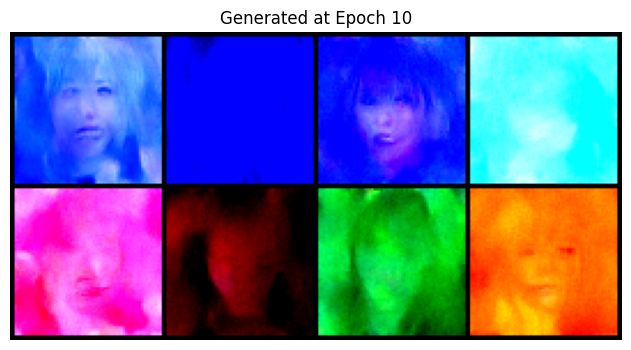


Epoch 11


100%|██████████| 1160/1160 [03:58<00:00,  4.86it/s, MSE=0.0159]


✅ Epoch 11 平均 Loss: 0.0191
[INFO] Learning rate: 0.000297
EMA Loss: 0.0169

Epoch 12


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0268]


✅ Epoch 12 平均 Loss: 0.0186
[INFO] Learning rate: 0.000296
EMA Loss: 0.0250

Epoch 13


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0324]


✅ Epoch 13 平均 Loss: 0.0191
[INFO] Learning rate: 0.000295
EMA Loss: 0.0298

Epoch 14


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0447]


✅ Epoch 14 平均 Loss: 0.0188
[INFO] Learning rate: 0.000295
EMA Loss: 0.0298

Epoch 15


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0149]


✅ Epoch 15 平均 Loss: 0.0186
[INFO] Learning rate: 0.000294
EMA Loss: 0.0242
[DEBUG] timestep: 912
[INFO] x_t range: -1.4977 ~ 2.3639
[INFO] predicted noise mean: 0.0006, std: 1.0014
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 15: R=0.715, G=0.533, B=0.555


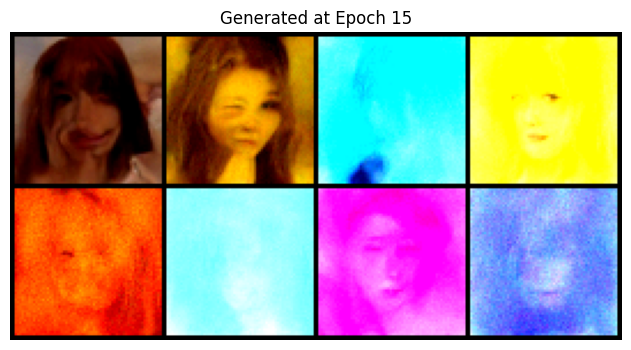


Epoch 16


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00809]


✅ Epoch 16 平均 Loss: 0.0186
[INFO] Learning rate: 0.000293
EMA Loss: 0.0119

Epoch 17


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0111]


✅ Epoch 17 平均 Loss: 0.0179
[INFO] Learning rate: 0.000292
EMA Loss: 0.0216

Epoch 18


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0434]


✅ Epoch 18 平均 Loss: 0.0183
[INFO] Learning rate: 0.000291
EMA Loss: 0.0312

Epoch 19


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.03]


✅ Epoch 19 平均 Loss: 0.0187
[INFO] Learning rate: 0.000290
EMA Loss: 0.0198

Epoch 20


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00502]


✅ Epoch 20 平均 Loss: 0.0181
[INFO] Learning rate: 0.000289
EMA Loss: 0.0136
[DEBUG] timestep: 15
[INFO] x_t range: -0.0114 ~ 0.9448
[INFO] predicted noise mean: 0.0012, std: 0.9325
[INFO] x_denoised range: 0.0000 ~ 0.9380


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 20: R=0.317, G=0.399, B=0.538


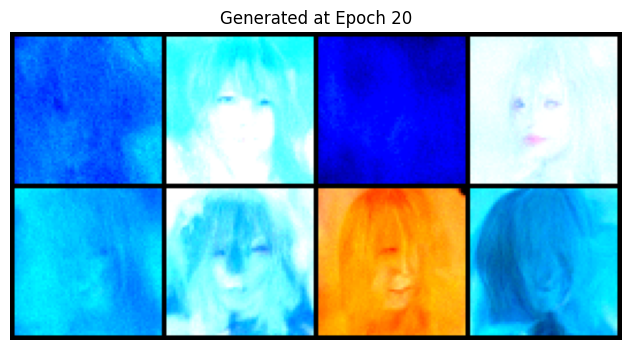


Epoch 21


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00596]


✅ Epoch 21 平均 Loss: 0.0179
[INFO] Learning rate: 0.000288
EMA Loss: 0.0164

Epoch 22


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00885]


✅ Epoch 22 平均 Loss: 0.0172
[INFO] Learning rate: 0.000287
EMA Loss: 0.0185

Epoch 23


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00235]


✅ Epoch 23 平均 Loss: 0.0178
[INFO] Learning rate: 0.000285
EMA Loss: 0.0166

Epoch 24


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00463]


✅ Epoch 24 平均 Loss: 0.0175
[INFO] Learning rate: 0.000284
EMA Loss: 0.0168

Epoch 25


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.012]


✅ Epoch 25 平均 Loss: 0.0180
[INFO] Learning rate: 0.000283
EMA Loss: 0.0158


Sampling: 999it [01:08, 14.69it/s]


[INFO] RGB mean at epoch 25: R=0.417, G=0.401, B=0.432


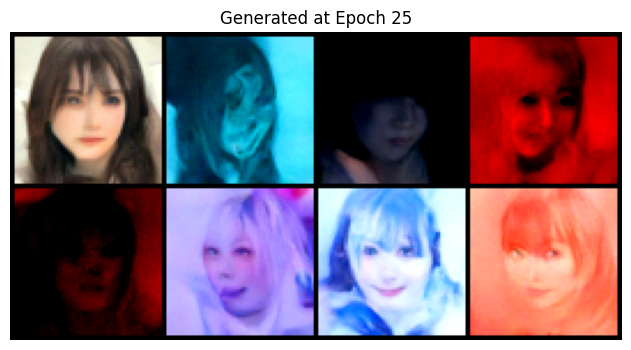


Epoch 26


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00603]


✅ Epoch 26 平均 Loss: 0.0172
[INFO] Learning rate: 0.000282
EMA Loss: 0.0097

Epoch 27


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00501]


✅ Epoch 27 平均 Loss: 0.0173
[INFO] Learning rate: 0.000280
EMA Loss: 0.0143

Epoch 28


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0206]


✅ Epoch 28 平均 Loss: 0.0174
[INFO] Learning rate: 0.000279
EMA Loss: 0.0150

Epoch 29


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00307]


✅ Epoch 29 平均 Loss: 0.0170
[INFO] Learning rate: 0.000277
EMA Loss: 0.0078

Epoch 30


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0231]


✅ Epoch 30 平均 Loss: 0.0172
[INFO] Learning rate: 0.000276
EMA Loss: 0.0200
[DEBUG] timestep: 501
[INFO] x_t range: -1.3024 ~ 2.3158
[INFO] predicted noise mean: -0.0005, std: 1.0000
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:07, 14.69it/s]


[INFO] RGB mean at epoch 30: R=0.529, G=0.493, B=0.469


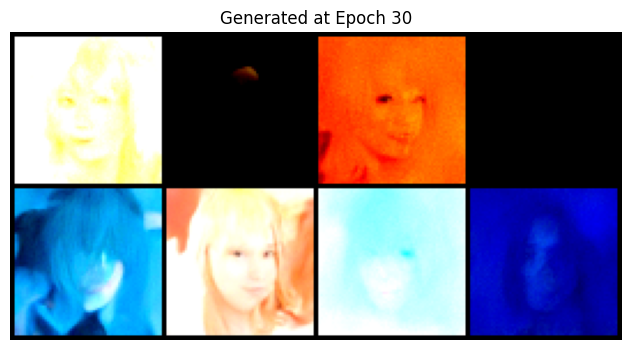


Epoch 31


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00918]


✅ Epoch 31 平均 Loss: 0.0171
[INFO] Learning rate: 0.000274
EMA Loss: 0.0123

Epoch 32


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00657]


✅ Epoch 32 平均 Loss: 0.0169
[INFO] Learning rate: 0.000272
EMA Loss: 0.0132

Epoch 33


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0149]


✅ Epoch 33 平均 Loss: 0.0172
[INFO] Learning rate: 0.000271
EMA Loss: 0.0107

Epoch 34


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00494]


✅ Epoch 34 平均 Loss: 0.0167
[INFO] Learning rate: 0.000269
EMA Loss: 0.0098

Epoch 35


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0526]


✅ Epoch 35 平均 Loss: 0.0175
[INFO] Learning rate: 0.000267
EMA Loss: 0.0326


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 35: R=0.671, G=0.649, B=0.649


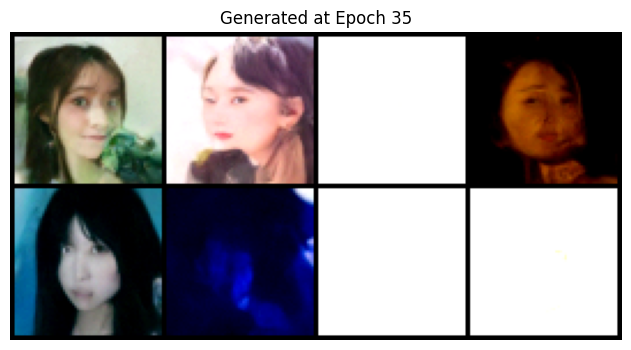


Epoch 36


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00204]


✅ Epoch 36 平均 Loss: 0.0171
[INFO] Learning rate: 0.000265
EMA Loss: 0.0064

Epoch 37


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0129]


✅ Epoch 37 平均 Loss: 0.0170
[INFO] Learning rate: 0.000263
EMA Loss: 0.0108

Epoch 38


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00788]


✅ Epoch 38 平均 Loss: 0.0170
[INFO] Learning rate: 0.000261
EMA Loss: 0.0124

Epoch 39


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.004]


✅ Epoch 39 平均 Loss: 0.0169
[INFO] Learning rate: 0.000260
EMA Loss: 0.0188

Epoch 40


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0115]


✅ Epoch 40 平均 Loss: 0.0167
[INFO] Learning rate: 0.000258
EMA Loss: 0.0185
[DEBUG] timestep: 37
[INFO] x_t range: -0.1403 ~ 1.0600
[INFO] predicted noise mean: 0.0001, std: 0.9655
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.69it/s]


[INFO] RGB mean at epoch 40: R=0.599, G=0.565, B=0.579


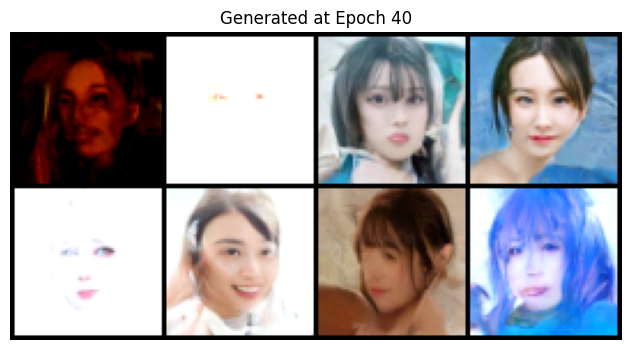


Epoch 41


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.0038]


✅ Epoch 41 平均 Loss: 0.0169
[INFO] Learning rate: 0.000255
EMA Loss: 0.0098

Epoch 42


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0467]


✅ Epoch 42 平均 Loss: 0.0174
[INFO] Learning rate: 0.000253
EMA Loss: 0.0338

Epoch 43


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0132]


✅ Epoch 43 平均 Loss: 0.0167
[INFO] Learning rate: 0.000251
EMA Loss: 0.0183

Epoch 44


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0128]


✅ Epoch 44 平均 Loss: 0.0170
[INFO] Learning rate: 0.000249
EMA Loss: 0.0244

Epoch 45


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00613]


✅ Epoch 45 平均 Loss: 0.0165
[INFO] Learning rate: 0.000247
EMA Loss: 0.0087


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 45: R=0.576, G=0.524, B=0.474


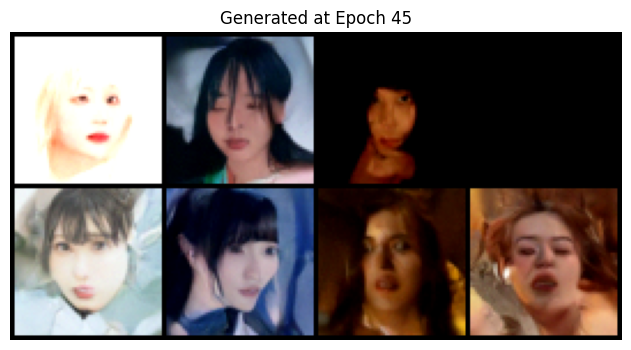


Epoch 46


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.0217]


✅ Epoch 46 平均 Loss: 0.0167
[INFO] Learning rate: 0.000245
EMA Loss: 0.0202

Epoch 47


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00221]


✅ Epoch 47 平均 Loss: 0.0166
[INFO] Learning rate: 0.000243
EMA Loss: 0.0145

Epoch 48


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0464]


✅ Epoch 48 平均 Loss: 0.0169
[INFO] Learning rate: 0.000240
EMA Loss: 0.0288

Epoch 49


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00554]


✅ Epoch 49 平均 Loss: 0.0167
[INFO] Learning rate: 0.000238
EMA Loss: 0.0111

Epoch 50


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0125]


✅ Epoch 50 平均 Loss: 0.0167
[INFO] Learning rate: 0.000236
EMA Loss: 0.0127
[DEBUG] timestep: 136
[INFO] x_t range: -0.6270 ~ 1.4358
[INFO] predicted noise mean: -0.0012, std: 0.9882
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 50: R=0.484, G=0.418, B=0.384


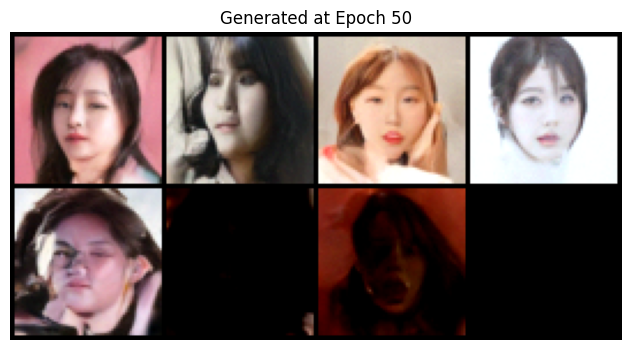


Epoch 51


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00303]


✅ Epoch 51 平均 Loss: 0.0165
[INFO] Learning rate: 0.000233
EMA Loss: 0.0113

Epoch 52


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0243]


✅ Epoch 52 平均 Loss: 0.0165
[INFO] Learning rate: 0.000231
EMA Loss: 0.0167

Epoch 53


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00624]


✅ Epoch 53 平均 Loss: 0.0171
[INFO] Learning rate: 0.000228
EMA Loss: 0.0172

Epoch 54


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0514]


✅ Epoch 54 平均 Loss: 0.0166
[INFO] Learning rate: 0.000226
EMA Loss: 0.0239

Epoch 55


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0117]


✅ Epoch 55 平均 Loss: 0.0167
[INFO] Learning rate: 0.000223
EMA Loss: 0.0133


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 55: R=0.514, G=0.474, B=0.477


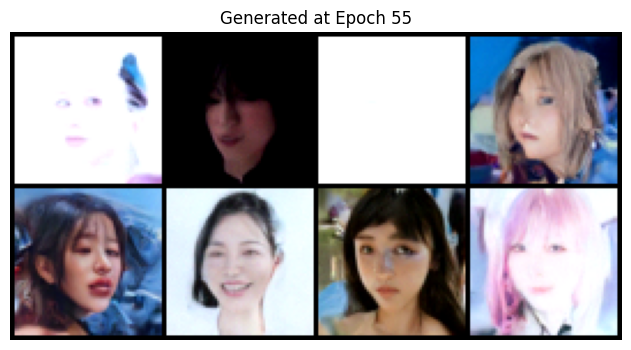


Epoch 56


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00182]


✅ Epoch 56 平均 Loss: 0.0164
[INFO] Learning rate: 0.000221
EMA Loss: 0.0099

Epoch 57


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0229]


✅ Epoch 57 平均 Loss: 0.0162
[INFO] Learning rate: 0.000218
EMA Loss: 0.0150

Epoch 58


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0162]


✅ Epoch 58 平均 Loss: 0.0171
[INFO] Learning rate: 0.000216
EMA Loss: 0.0226

Epoch 59


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0184]


✅ Epoch 59 平均 Loss: 0.0168
[INFO] Learning rate: 0.000213
EMA Loss: 0.0131

Epoch 60


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0118]


✅ Epoch 60 平均 Loss: 0.0163
[INFO] Learning rate: 0.000210
EMA Loss: 0.0124
[DEBUG] timestep: 443
[INFO] x_t range: -1.1906 ~ 2.4548
[INFO] predicted noise mean: 0.0000, std: 0.9982
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 60: R=0.634, G=0.556, B=0.523


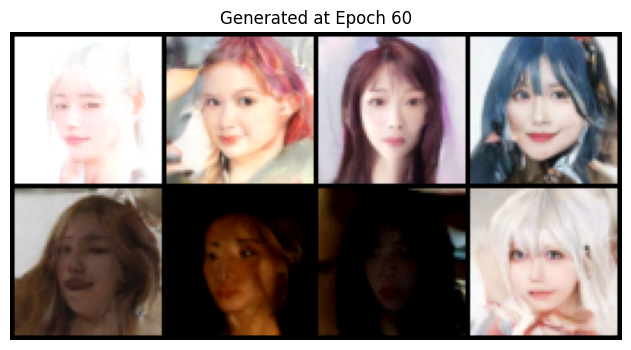


Epoch 61


100%|██████████| 1160/1160 [03:57<00:00,  4.89it/s, MSE=0.0172]


✅ Epoch 61 平均 Loss: 0.0162
[INFO] Learning rate: 0.000208
EMA Loss: 0.0139

Epoch 62


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00765]


✅ Epoch 62 平均 Loss: 0.0167
[INFO] Learning rate: 0.000205
EMA Loss: 0.0106

Epoch 63


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00623]


✅ Epoch 63 平均 Loss: 0.0163
[INFO] Learning rate: 0.000203
EMA Loss: 0.0091

Epoch 64


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0148]


✅ Epoch 64 平均 Loss: 0.0167
[INFO] Learning rate: 0.000200
EMA Loss: 0.0202

Epoch 65


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0363]


✅ Epoch 65 平均 Loss: 0.0163
[INFO] Learning rate: 0.000197
EMA Loss: 0.0247


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 65: R=0.449, G=0.377, B=0.371


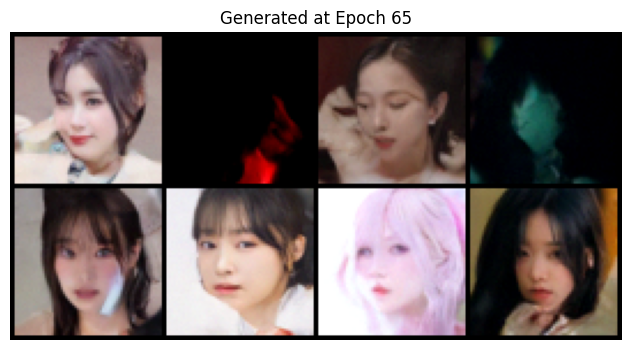


Epoch 66


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00304]


✅ Epoch 66 平均 Loss: 0.0165
[INFO] Learning rate: 0.000194
EMA Loss: 0.0133

Epoch 67


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00769]


✅ Epoch 67 平均 Loss: 0.0159
[INFO] Learning rate: 0.000192
EMA Loss: 0.0099

Epoch 68


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0337]


✅ Epoch 68 平均 Loss: 0.0166
[INFO] Learning rate: 0.000189
EMA Loss: 0.0210

Epoch 69


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0564]


✅ Epoch 69 平均 Loss: 0.0161
[INFO] Learning rate: 0.000186
EMA Loss: 0.0302

Epoch 70


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0135]


✅ Epoch 70 平均 Loss: 0.0164
[INFO] Learning rate: 0.000183
EMA Loss: 0.0127
[DEBUG] timestep: 166
[INFO] x_t range: -0.7160 ~ 1.6597
[INFO] predicted noise mean: -0.0002, std: 0.9899
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.69it/s]


[INFO] RGB mean at epoch 70: R=0.522, G=0.465, B=0.445


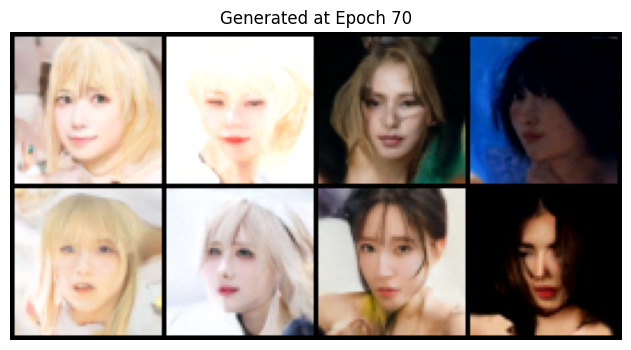


Epoch 71


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00597]


✅ Epoch 71 平均 Loss: 0.0164
[INFO] Learning rate: 0.000180
EMA Loss: 0.0153

Epoch 72


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00579]


✅ Epoch 72 平均 Loss: 0.0165
[INFO] Learning rate: 0.000178
EMA Loss: 0.0104

Epoch 73


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00901]


✅ Epoch 73 平均 Loss: 0.0163
[INFO] Learning rate: 0.000175
EMA Loss: 0.0122

Epoch 74


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.012]


✅ Epoch 74 平均 Loss: 0.0160
[INFO] Learning rate: 0.000172
EMA Loss: 0.0196

Epoch 75


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0288]


✅ Epoch 75 平均 Loss: 0.0161
[INFO] Learning rate: 0.000169
EMA Loss: 0.0216


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 75: R=0.465, G=0.383, B=0.363


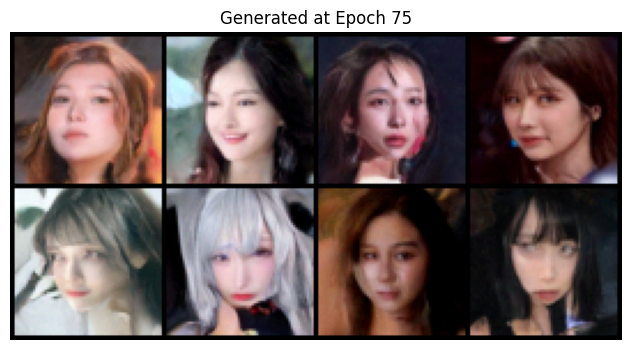


Epoch 76


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.00407]


✅ Epoch 76 平均 Loss: 0.0160
[INFO] Learning rate: 0.000166
EMA Loss: 0.0087

Epoch 77


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0372]


✅ Epoch 77 平均 Loss: 0.0166
[INFO] Learning rate: 0.000164
EMA Loss: 0.0197

Epoch 78


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00783]


✅ Epoch 78 平均 Loss: 0.0162
[INFO] Learning rate: 0.000161
EMA Loss: 0.0082

Epoch 79


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0262]


✅ Epoch 79 平均 Loss: 0.0162
[INFO] Learning rate: 0.000158
EMA Loss: 0.0209

Epoch 80


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0426]


✅ Epoch 80 平均 Loss: 0.0165
[INFO] Learning rate: 0.000155
EMA Loss: 0.0250
[DEBUG] timestep: 637
[INFO] x_t range: -1.7163 ~ 2.2991
[INFO] predicted noise mean: 0.0006, std: 0.9992
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 80: R=0.518, G=0.450, B=0.437


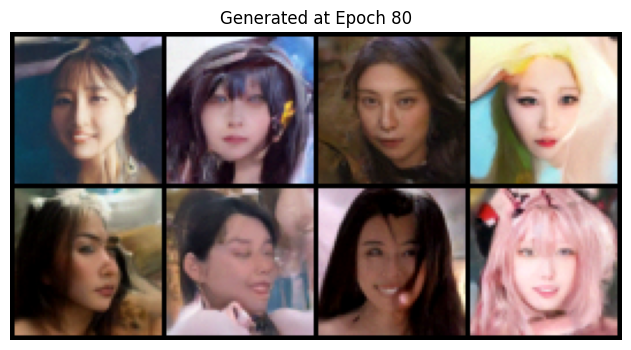


Epoch 81


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.0311]


✅ Epoch 81 平均 Loss: 0.0163
[INFO] Learning rate: 0.000152
EMA Loss: 0.0377

Epoch 82


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0169]


✅ Epoch 82 平均 Loss: 0.0162
[INFO] Learning rate: 0.000149
EMA Loss: 0.0133

Epoch 83


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00691]


✅ Epoch 83 平均 Loss: 0.0159
[INFO] Learning rate: 0.000146
EMA Loss: 0.0111

Epoch 84


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.071]


✅ Epoch 84 平均 Loss: 0.0162
[INFO] Learning rate: 0.000144
EMA Loss: 0.0309

Epoch 85


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0114]


✅ Epoch 85 平均 Loss: 0.0165
[INFO] Learning rate: 0.000141
EMA Loss: 0.0216


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 85: R=0.505, G=0.464, B=0.487


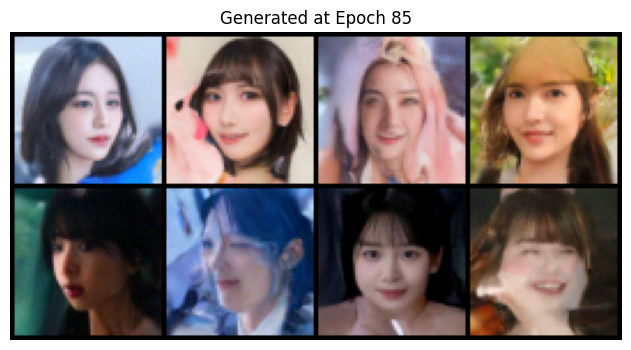


Epoch 86


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00154]


✅ Epoch 86 平均 Loss: 0.0163
[INFO] Learning rate: 0.000138
EMA Loss: 0.0131

Epoch 87


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0376]


✅ Epoch 87 平均 Loss: 0.0159
[INFO] Learning rate: 0.000135
EMA Loss: 0.0225

Epoch 88


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00214]


✅ Epoch 88 平均 Loss: 0.0161
[INFO] Learning rate: 0.000132
EMA Loss: 0.0073

Epoch 89


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00886]


✅ Epoch 89 平均 Loss: 0.0161
[INFO] Learning rate: 0.000130
EMA Loss: 0.0143

Epoch 90


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0492]


✅ Epoch 90 平均 Loss: 0.0162
[INFO] Learning rate: 0.000127
EMA Loss: 0.0254
[DEBUG] timestep: 959
[INFO] x_t range: -1.1823 ~ 2.1932
[INFO] predicted noise mean: 0.0062, std: 1.0009
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 90: R=0.542, G=0.455, B=0.421


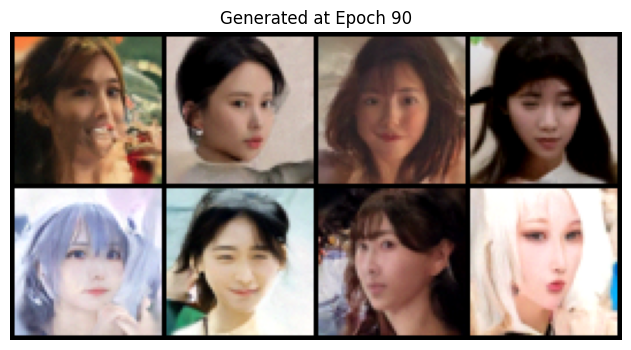


Epoch 91


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.0178]


✅ Epoch 91 平均 Loss: 0.0162
[INFO] Learning rate: 0.000124
EMA Loss: 0.0145

Epoch 92


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0409]


✅ Epoch 92 平均 Loss: 0.0159
[INFO] Learning rate: 0.000121
EMA Loss: 0.0329

Epoch 93


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0077]


✅ Epoch 93 平均 Loss: 0.0158
[INFO] Learning rate: 0.000118
EMA Loss: 0.0076

Epoch 94


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0122]


✅ Epoch 94 平均 Loss: 0.0157
[INFO] Learning rate: 0.000116
EMA Loss: 0.0172

Epoch 95


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00719]


✅ Epoch 95 平均 Loss: 0.0163
[INFO] Learning rate: 0.000113
EMA Loss: 0.0160


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 95: R=0.579, G=0.487, B=0.464


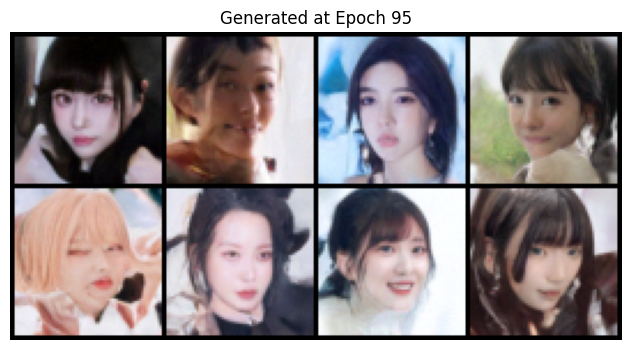


Epoch 96


100%|██████████| 1160/1160 [03:58<00:00,  4.87it/s, MSE=0.0122]


✅ Epoch 96 平均 Loss: 0.0161
[INFO] Learning rate: 0.000110
EMA Loss: 0.0175

Epoch 97


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0186]


✅ Epoch 97 平均 Loss: 0.0161
[INFO] Learning rate: 0.000107
EMA Loss: 0.0226

Epoch 98


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00309]


✅ Epoch 98 平均 Loss: 0.0160
[INFO] Learning rate: 0.000105
EMA Loss: 0.0139

Epoch 99


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0506]


✅ Epoch 99 平均 Loss: 0.0159
[INFO] Learning rate: 0.000102
EMA Loss: 0.0300

Epoch 100


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0876]


✅ Epoch 100 平均 Loss: 0.0160
[INFO] Learning rate: 0.000100
EMA Loss: 0.0387
[DEBUG] timestep: 622
[INFO] x_t range: -1.3339 ~ 2.4248
[INFO] predicted noise mean: -0.0011, std: 0.9993
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 100: R=0.529, G=0.479, B=0.463


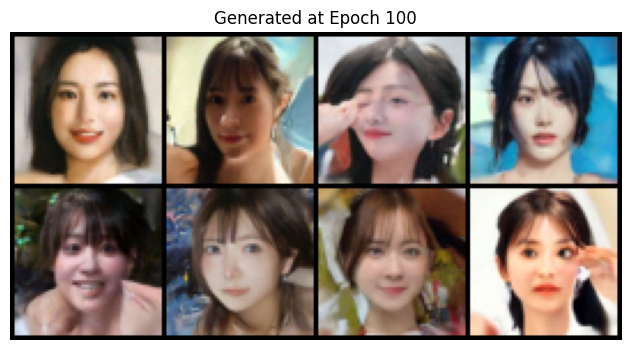


Epoch 101


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.0262]


✅ Epoch 101 平均 Loss: 0.0162
[INFO] Learning rate: 0.000097
EMA Loss: 0.0179

Epoch 102


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00124]


✅ Epoch 102 平均 Loss: 0.0157
[INFO] Learning rate: 0.000094
EMA Loss: 0.0173

Epoch 103


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00349]


✅ Epoch 103 平均 Loss: 0.0156
[INFO] Learning rate: 0.000092
EMA Loss: 0.0131

Epoch 104


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00396]


✅ Epoch 104 平均 Loss: 0.0156
[INFO] Learning rate: 0.000089
EMA Loss: 0.0110

Epoch 105


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0883]


✅ Epoch 105 平均 Loss: 0.0162
[INFO] Learning rate: 0.000087
EMA Loss: 0.0406


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 105: R=0.551, G=0.462, B=0.436


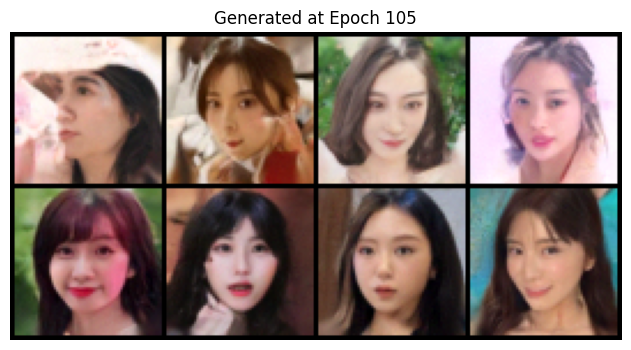


Epoch 106


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00972]


✅ Epoch 106 平均 Loss: 0.0161
[INFO] Learning rate: 0.000084
EMA Loss: 0.0227

Epoch 107


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.023]


✅ Epoch 107 平均 Loss: 0.0161
[INFO] Learning rate: 0.000082
EMA Loss: 0.0155

Epoch 108


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00849]


✅ Epoch 108 平均 Loss: 0.0161
[INFO] Learning rate: 0.000079
EMA Loss: 0.0145

Epoch 109


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00151]


✅ Epoch 109 平均 Loss: 0.0165
[INFO] Learning rate: 0.000077
EMA Loss: 0.0153

Epoch 110


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0113]


✅ Epoch 110 平均 Loss: 0.0158
[INFO] Learning rate: 0.000074
EMA Loss: 0.0147
[DEBUG] timestep: 443
[INFO] x_t range: -1.4217 ~ 2.6235
[INFO] predicted noise mean: -0.0000, std: 0.9969
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.65it/s]


[INFO] RGB mean at epoch 110: R=0.499, G=0.424, B=0.407


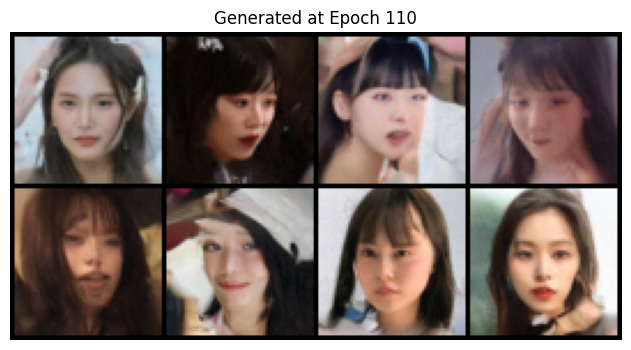


Epoch 111


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00557]


✅ Epoch 111 平均 Loss: 0.0157
[INFO] Learning rate: 0.000072
EMA Loss: 0.0110

Epoch 112


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00826]


✅ Epoch 112 平均 Loss: 0.0160
[INFO] Learning rate: 0.000070
EMA Loss: 0.0103

Epoch 113


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0178]


✅ Epoch 113 平均 Loss: 0.0159
[INFO] Learning rate: 0.000067
EMA Loss: 0.0109

Epoch 114


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0101]


✅ Epoch 114 平均 Loss: 0.0155
[INFO] Learning rate: 0.000065
EMA Loss: 0.0151

Epoch 115


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0106]


✅ Epoch 115 平均 Loss: 0.0160
[INFO] Learning rate: 0.000063
EMA Loss: 0.0210


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 115: R=0.533, G=0.450, B=0.416


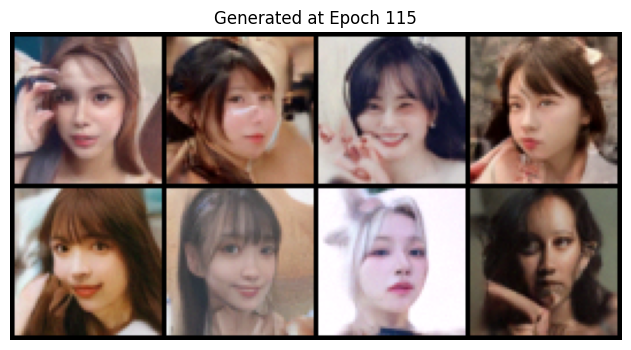


Epoch 116


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00196]


✅ Epoch 116 平均 Loss: 0.0164
[INFO] Learning rate: 0.000061
EMA Loss: 0.0172

Epoch 117


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.016]


✅ Epoch 117 平均 Loss: 0.0160
[INFO] Learning rate: 0.000059
EMA Loss: 0.0194

Epoch 118


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00893]


✅ Epoch 118 平均 Loss: 0.0161
[INFO] Learning rate: 0.000057
EMA Loss: 0.0121

Epoch 119


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.000478]


✅ Epoch 119 平均 Loss: 0.0154
[INFO] Learning rate: 0.000055
EMA Loss: 0.0141

Epoch 120


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0195]


✅ Epoch 120 平均 Loss: 0.0159
[INFO] Learning rate: 0.000052
EMA Loss: 0.0188
[DEBUG] timestep: 694
[INFO] x_t range: -1.4697 ~ 2.4531
[INFO] predicted noise mean: -0.0016, std: 1.0004
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 120: R=0.520, G=0.448, B=0.429


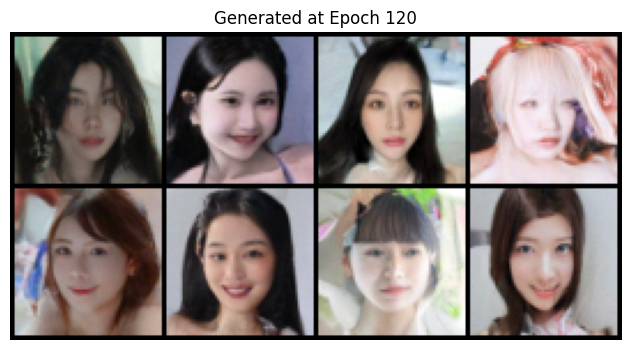


Epoch 121


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.000587]


✅ Epoch 121 平均 Loss: 0.0157
[INFO] Learning rate: 0.000050
EMA Loss: 0.0175

Epoch 122


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0124]


✅ Epoch 122 平均 Loss: 0.0158
[INFO] Learning rate: 0.000049
EMA Loss: 0.0115

Epoch 123


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0202]


✅ Epoch 123 平均 Loss: 0.0159
[INFO] Learning rate: 0.000047
EMA Loss: 0.0145

Epoch 124


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0329]


✅ Epoch 124 平均 Loss: 0.0155
[INFO] Learning rate: 0.000045
EMA Loss: 0.0194

Epoch 125


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0468]


✅ Epoch 125 平均 Loss: 0.0162
[INFO] Learning rate: 0.000043
EMA Loss: 0.0265


Sampling: 999it [01:07, 14.69it/s]


[INFO] RGB mean at epoch 125: R=0.499, G=0.430, B=0.422


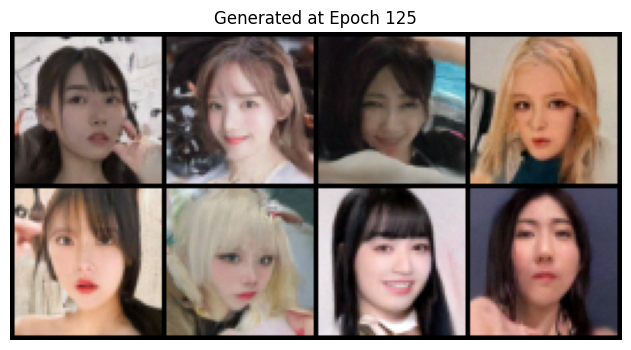


Epoch 126


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.00875]


✅ Epoch 126 平均 Loss: 0.0157
[INFO] Learning rate: 0.000041
EMA Loss: 0.0075

Epoch 127


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0444]


✅ Epoch 127 平均 Loss: 0.0157
[INFO] Learning rate: 0.000039
EMA Loss: 0.0232

Epoch 128


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00395]


✅ Epoch 128 平均 Loss: 0.0155
[INFO] Learning rate: 0.000038
EMA Loss: 0.0084

Epoch 129


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00492]


✅ Epoch 129 平均 Loss: 0.0155
[INFO] Learning rate: 0.000036
EMA Loss: 0.0214

Epoch 130


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0691]


✅ Epoch 130 平均 Loss: 0.0160
[INFO] Learning rate: 0.000034
EMA Loss: 0.0271
[DEBUG] timestep: 711
[INFO] x_t range: -1.4517 ~ 2.4117
[INFO] predicted noise mean: -0.0021, std: 1.0009
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 130: R=0.524, G=0.464, B=0.451


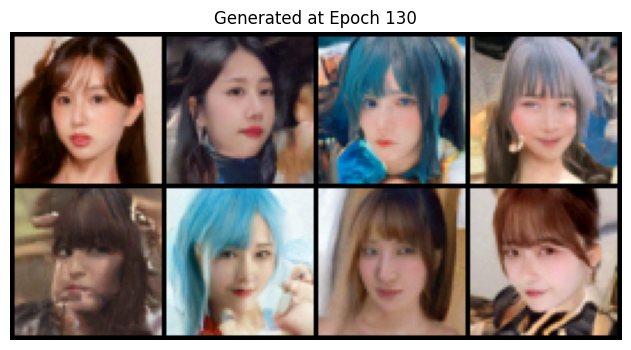


Epoch 131


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.0101]


✅ Epoch 131 平均 Loss: 0.0157
[INFO] Learning rate: 0.000033
EMA Loss: 0.0147

Epoch 132


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00969]


✅ Epoch 132 平均 Loss: 0.0158
[INFO] Learning rate: 0.000031
EMA Loss: 0.0118

Epoch 133


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00623]


✅ Epoch 133 平均 Loss: 0.0155
[INFO] Learning rate: 0.000030
EMA Loss: 0.0143

Epoch 134


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0067]


✅ Epoch 134 平均 Loss: 0.0158
[INFO] Learning rate: 0.000028
EMA Loss: 0.0227

Epoch 135


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0107]


✅ Epoch 135 平均 Loss: 0.0156
[INFO] Learning rate: 0.000027
EMA Loss: 0.0130


Sampling: 999it [01:08, 14.68it/s]


[INFO] RGB mean at epoch 135: R=0.472, G=0.412, B=0.401


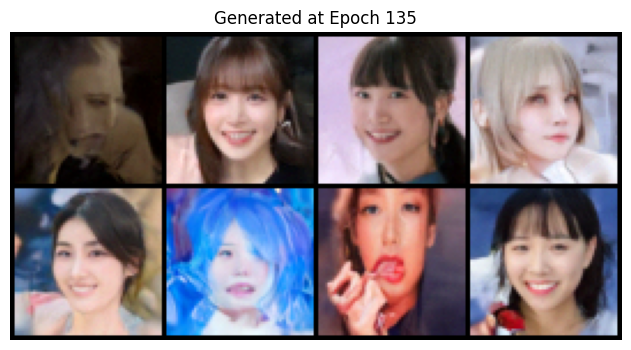


Epoch 136


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.0344]


✅ Epoch 136 平均 Loss: 0.0161
[INFO] Learning rate: 0.000026
EMA Loss: 0.0170

Epoch 137


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00508]


✅ Epoch 137 平均 Loss: 0.0158
[INFO] Learning rate: 0.000025
EMA Loss: 0.0088

Epoch 138


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0466]


✅ Epoch 138 平均 Loss: 0.0159
[INFO] Learning rate: 0.000023
EMA Loss: 0.0225

Epoch 139


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.011]


✅ Epoch 139 平均 Loss: 0.0159
[INFO] Learning rate: 0.000022
EMA Loss: 0.0105

Epoch 140


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0373]


✅ Epoch 140 平均 Loss: 0.0157
[INFO] Learning rate: 0.000021
EMA Loss: 0.0189
[DEBUG] timestep: 151
[INFO] x_t range: -0.6523 ~ 1.4991
[INFO] predicted noise mean: 0.0001, std: 0.9902
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.66it/s]


[INFO] RGB mean at epoch 140: R=0.473, G=0.395, B=0.364


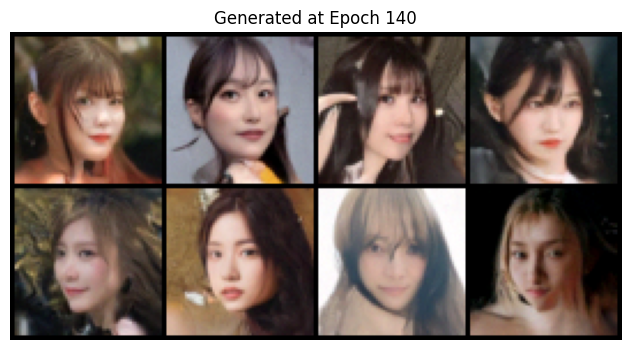


Epoch 141


100%|██████████| 1160/1160 [03:59<00:00,  4.85it/s, MSE=0.0199]


✅ Epoch 141 平均 Loss: 0.0156
[INFO] Learning rate: 0.000020
EMA Loss: 0.0175

Epoch 142


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00539]


✅ Epoch 142 平均 Loss: 0.0157
[INFO] Learning rate: 0.000019
EMA Loss: 0.0164

Epoch 143


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0139]


✅ Epoch 143 平均 Loss: 0.0160
[INFO] Learning rate: 0.000018
EMA Loss: 0.0153

Epoch 144


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0164]


✅ Epoch 144 平均 Loss: 0.0157
[INFO] Learning rate: 0.000017
EMA Loss: 0.0208

Epoch 145


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0361]


✅ Epoch 145 平均 Loss: 0.0154
[INFO] Learning rate: 0.000016
EMA Loss: 0.0201


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 145: R=0.594, G=0.510, B=0.478


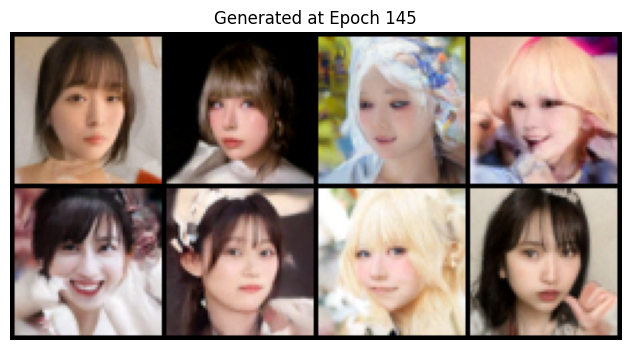


Epoch 146


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.00708]


✅ Epoch 146 平均 Loss: 0.0159
[INFO] Learning rate: 0.000015
EMA Loss: 0.0113

Epoch 147


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0156]


✅ Epoch 147 平均 Loss: 0.0154
[INFO] Learning rate: 0.000015
EMA Loss: 0.0145

Epoch 148


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.00437]


✅ Epoch 148 平均 Loss: 0.0152
[INFO] Learning rate: 0.000014
EMA Loss: 0.0108

Epoch 149


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00757]


✅ Epoch 149 平均 Loss: 0.0160
[INFO] Learning rate: 0.000013
EMA Loss: 0.0124

Epoch 150


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00733]


✅ Epoch 150 平均 Loss: 0.0157
[INFO] Learning rate: 0.000013
EMA Loss: 0.0081
[DEBUG] timestep: 678
[INFO] x_t range: -1.4427 ~ 2.2762
[INFO] predicted noise mean: 0.0002, std: 1.0001
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 150: R=0.496, G=0.423, B=0.385


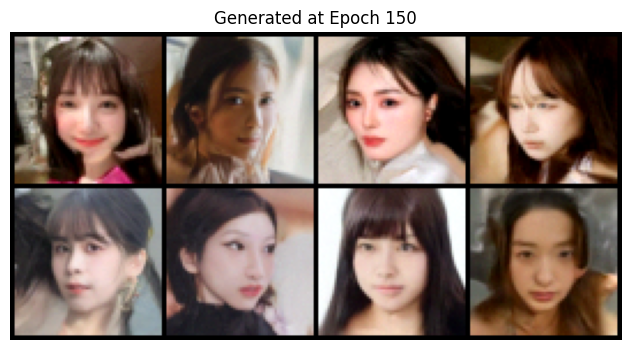


Epoch 151


100%|██████████| 1160/1160 [03:58<00:00,  4.87it/s, MSE=0.00535]


✅ Epoch 151 平均 Loss: 0.0151
[INFO] Learning rate: 0.000012
EMA Loss: 0.0121

Epoch 152


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0341]


✅ Epoch 152 平均 Loss: 0.0151
[INFO] Learning rate: 0.000012
EMA Loss: 0.0302

Epoch 153


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0126]


✅ Epoch 153 平均 Loss: 0.0156
[INFO] Learning rate: 0.000011
EMA Loss: 0.0105

Epoch 154


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.00855]


✅ Epoch 154 平均 Loss: 0.0155
[INFO] Learning rate: 0.000011
EMA Loss: 0.0167

Epoch 155


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0293]


✅ Epoch 155 平均 Loss: 0.0160
[INFO] Learning rate: 0.000011
EMA Loss: 0.0219


Sampling: 999it [01:08, 14.67it/s]


[INFO] RGB mean at epoch 155: R=0.538, G=0.468, B=0.447


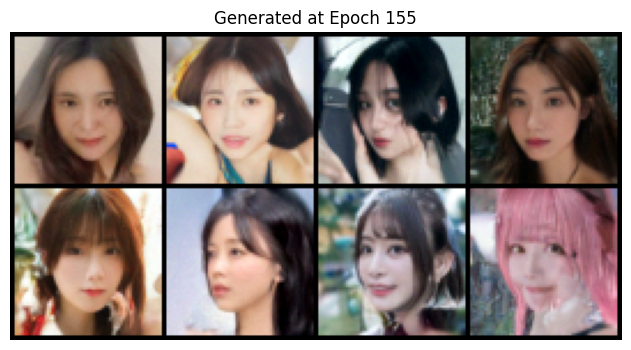


Epoch 156


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.000182]


✅ Epoch 156 平均 Loss: 0.0157
[INFO] Learning rate: 0.000010
EMA Loss: 0.0101

Epoch 157


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0178]


✅ Epoch 157 平均 Loss: 0.0157
[INFO] Learning rate: 0.000010
EMA Loss: 0.0139

Epoch 158


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0313]


✅ Epoch 158 平均 Loss: 0.0151
[INFO] Learning rate: 0.000010
EMA Loss: 0.0224

Epoch 159


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0159]


✅ Epoch 159 平均 Loss: 0.0155
[INFO] Learning rate: 0.000010
EMA Loss: 0.0169

Epoch 160


100%|██████████| 1160/1160 [03:56<00:00,  4.91it/s, MSE=0.0176]


✅ Epoch 160 平均 Loss: 0.0152
[INFO] Learning rate: 0.000010
EMA Loss: 0.0170
[DEBUG] timestep: 657
[INFO] x_t range: -1.6716 ~ 2.3752
[INFO] predicted noise mean: -0.0019, std: 0.9999
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:08, 14.69it/s]


[INFO] RGB mean at epoch 160: R=0.498, G=0.430, B=0.414


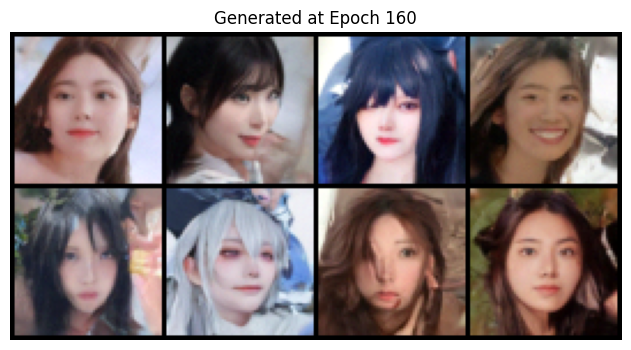

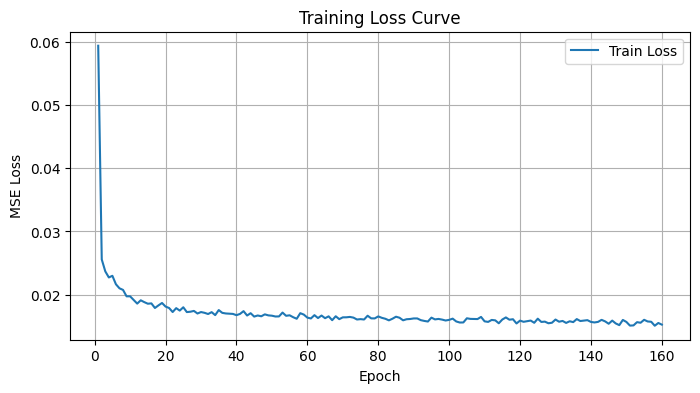

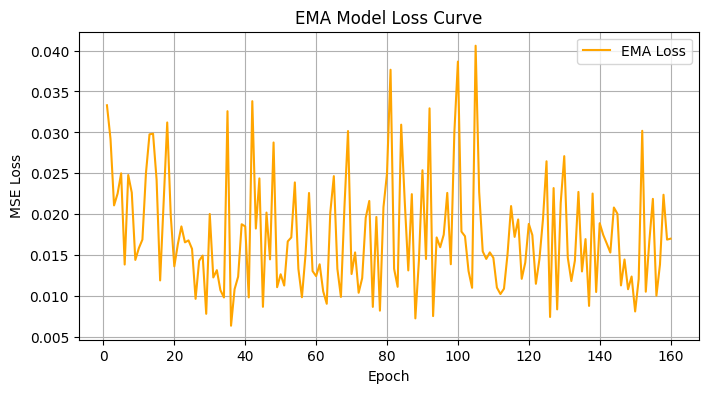

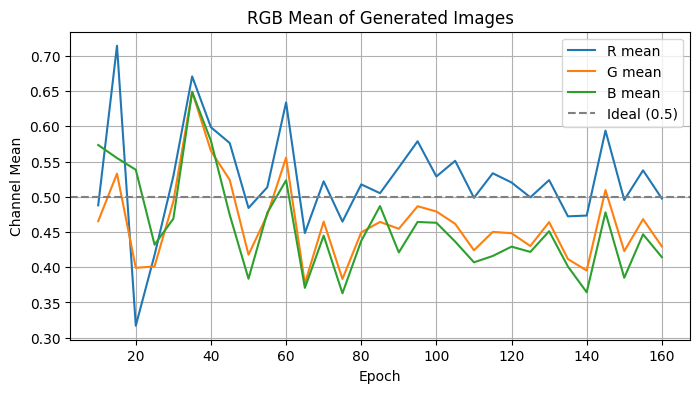

In [ ]:
# ========== 開始訓練 ==========
train_model(
    run_name="ddpm_3",
    dataset_path="/content/drive/MyDrive/positioned_faces/alldata",
    image_size=64,  # 改為 64 表示先訓練小尺寸
    batch_size=16,
    epochs=160,
    lr=3e-4,
    device="cuda" if torch.cuda.is_available() else "cpu",
    seed=2025,
    noise_steps=1000,
    beta_start=1e-4,
    beta_end=0.02,
)

#### 110epoch生成10000張=>FID 42.99

In [ ]:
# epoch = 110
def generate_images(model_ckpt, output_dir, image_size=64, total_images=10000, batch_size=100, device="cuda", seed=2025):
    seed_everything(seed)
    os.makedirs(output_dir, exist_ok=True)

    model = StrongerUNet(device=device).to(device)
    ckpt = torch.load(model_ckpt, map_location=device)
    model.load_state_dict(ckpt["ema_model"])
    model.eval()

    diffusion = Diffusion(img_size=image_size, device=device)

    saved_count = 0
    idx = 0

    with torch.no_grad():
        while saved_count < total_images:
            n = min(batch_size, total_images - saved_count)
            sampled = diffusion.sample(model, n=n)
            sampled = (sampled * 255).clamp(0, 255).byte()

            for j in range(sampled.size(0)):
                img_tensor = sampled[j]
                img = transforms.ToPILImage()(img_tensor.cpu())
                img.save(os.path.join(output_dir, f"{idx:05d}.png"))
                idx += 1
                saved_count += 1

    print(f"✅ 實際產生 {saved_count} 張圖片（已自動略過過曝）")
generate_images(
    model_ckpt="/content/drive/MyDrive/ddpm3_checkpoints/epoch_109.pt",        # ← 你指定的模型檔案
    output_dir="generated_images",   # ← 輸出資料夾
    image_size=64,
    total_images=10000,
    batch_size=85,
    device="cuda" if torch.cuda.is_available() else "cpu"
    )

Sampling: 999it [05:12,  3.19it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:11,  3.21it/s]
Sampling: 999it [05:

✅ 實際產生 10000 張圖片（已自動略過過曝）


In [ ]:
import os
import shutil
from tqdm import tqdm

def backup_generated_images(output_dir="generated_images", final_backup_dir="/content/drive/MyDrive/ddpm3test5"):
    os.makedirs(final_backup_dir, exist_ok=True)
    for fname in tqdm(os.listdir(output_dir), desc="Copying to Google Drive"):
        src_path = os.path.join(output_dir, fname)
        dst_path = os.path.join(final_backup_dir, fname)
        shutil.copy2(src_path, dst_path)  # copy2 保留 metadata

    print(f"✅ 所有圖片已複製到 {final_backup_dir}")

backup_generated_images()

Copying to Google Drive: 100%|██████████| 10000/10000 [00:56<00:00, 177.04it/s]

✅ 所有圖片已複製到 /content/drive/MyDrive/ddpm3test5


In [ ]:
# ==== 路徑設定（你可以根據實際情況修改）====
IMG_DIR = "/content/generated_images"  # ← 你產生的圖片資料夾
REF_MU_PATH = "/content/drive/MyDrive/Evaluation/test_mu.npy"
REF_SIGMA_PATH = "/content/drive/MyDrive/Evaluation/test_sigma.npy"
BATCH_SIZE = 32
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def get_inception_model(device):
    weights = Inception_V3_Weights.IMAGENET1K_V1
    model = inception_v3(weights=weights, transform_input=False)
    model.fc = torch.nn.Identity()
    model.to(device)
    model.eval()
    return model


def get_image_transform():
    return transforms.Compose([
        transforms.Resize((299, 299)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)
    ])


def extract_features(img_dir, model, transform, device, batch_size=32):
    files = [os.path.join(img_dir, f) for f in os.listdir(img_dir)
             if f.lower().endswith((".jpg", ".png", ".jpeg"))]
    if len(files) == 0:
        raise ValueError(f"No image files found in {img_dir}")

    features = []
    with torch.no_grad():
        for i in tqdm(range(0, len(files), batch_size), desc="Extracting features"):
            batch = []
            for f in files[i:i + batch_size]:
                try:
                    img = Image.open(f).convert('RGB')
                    batch.append(transform(img))
                except Exception as e:
                    print(f"[WARNING] Failed to load image: {f} ({e})")
            if not batch:
                continue
            batch = torch.stack(batch).to(device)
            pred = model(batch)
            features.append(pred.cpu().numpy())

    if not features:
        raise ValueError("No valid features extracted. Check image files or transform.")

    return np.concatenate(features, axis=0)


def calculate_activation_statistics(features):
    mu = np.mean(features, axis=0)
    sigma = np.cov(features, rowvar=False)
    return mu, sigma


def calculate_fid(mu1, sigma1, mu2, sigma2):
    covmean, _ = linalg.sqrtm(sigma1 @ sigma2, disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    diff = mu1 - mu2
    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid


# ==== 執行 ====
print(f"[INFO] Using device: {DEVICE}")
model = get_inception_model(DEVICE)
transform = get_image_transform()

features = extract_features(IMG_DIR, model, transform, DEVICE, batch_size=BATCH_SIZE)
mu_fake, sigma_fake = calculate_activation_statistics(features)

mu_real = np.load(REF_MU_PATH)
sigma_real = np.load(REF_SIGMA_PATH)

fid_score = calculate_fid(mu_real, sigma_real, mu_fake, sigma_fake)
print(f"\n✅ FID score = {fid_score:.4f}")

[INFO] Using device: cuda


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 168MB/s] 
Extracting features: 100%|██████████| 313/313 [00:27<00:00, 11.35it/s]



✅ FID score = 42.9299


#### Resume=>跑到180

In [ ]:
def debug_sample(model, diffusion, dataset, device="cuda"):
    model.eval()
    img, _ = dataset[0]
    img = img.unsqueeze(0).to(device)

    t = diffusion.sample_timesteps(1)
    x_t, noise = diffusion.noise_images(img, t)
    predicted = model(x_t, t)

    alpha = diffusion.alpha[t][:, None, None, None]
    alpha_hat = diffusion.alpha_hat[t][:, None, None, None]
    x_denoised = (1 / torch.sqrt(alpha)) * (
        x_t - ((1 - alpha) / torch.sqrt(1 - alpha_hat)) * predicted
    )

    x_denoised = x_denoised.clamp(-1, 1).cpu()
    x_denoised = (x_denoised + 1) / 2
    x_t = (x_t.cpu() + 1) / 2

    print(f"[DEBUG] timestep: {t.item()}")
    print(f"[INFO] x_t range: {x_t.min().item():.4f} ~ {x_t.max().item():.4f}")
    print(f"[INFO] predicted noise mean: {predicted.mean().item():.4f}, std: {predicted.std().item():.4f}")
    print(f"[INFO] x_denoised range: {x_denoised.min().item():.4f} ~ {x_denoised.max().item():.4f}")



In [ ]:
def load_checkpoint(ckpt_path, model, optimizer=None, scheduler=None, ema_model=None):
    checkpoint = torch.load(ckpt_path)
    model.load_state_dict(checkpoint["model"])
    if optimizer and "optimizer" in checkpoint:
        optimizer.load_state_dict(checkpoint["optimizer"])
    if scheduler and "scheduler" in checkpoint:
        scheduler.load_state_dict(checkpoint["scheduler"])
    if ema_model and "ema_model" in checkpoint:
        ema_model.load_state_dict(checkpoint["ema_model"])
    start_epoch = checkpoint.get("epoch", 0)
    return model, optimizer, scheduler, ema_model, start_epoch

def resume_train_model(run_name, dataset_path, image_size=64, batch_size=16, total_epochs=90,
                       lr=3e-4, device="cuda", seed=2025, noise_steps=1000, beta_start=1e-4,
                       beta_end=0.02, save_every=5, resume_ckpt=None):

    rgb_means = []
    seed_everything(seed)
    dataset = SimpleImageFolder(dataset_path, image_size)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

    model = StrongerUNet(device=device).to(device)
    diffusion = Diffusion(noise_steps=noise_steps, beta_start=beta_start, beta_end=beta_end,
                          img_size=image_size, device=device)
    ema = EMA(0.998)
    ema_model = copy.deepcopy(model).eval().requires_grad_(False)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

    mse = nn.MSELoss()

    start_epoch = 0
    scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs, eta_min=1e-5)  # 預設
    if resume_ckpt:
        model, optimizer, scheduler, ema_model, start_epoch = load_checkpoint(
            resume_ckpt, model, optimizer, scheduler, ema_model
        )
        scheduler = CosineAnnealingLR(optimizer, T_max=total_epochs - start_epoch, eta_min=1e-5)
        print(f"[INFO] Resuming from epoch {start_epoch}")

    print(f"[CHECK] Training will continue from epoch {start_epoch} to {total_epochs - 1}")
    os.makedirs(f"models/{run_name}", exist_ok=True)
    os.makedirs(f"results/{run_name}", exist_ok=True)

    for epoch in range(start_epoch, total_epochs):
        print(f"\nEpoch {epoch+1}")
        model.train()
        epoch_loss = 0
        pbar = tqdm(dataloader)

        for i, (images, _) in enumerate(pbar):
            images = images.to(device)
            t = diffusion.sample_timesteps(images.size(0))
            x_t, noise = diffusion.noise_images(images, t)

            predicted = model(x_t, t)
            loss = mse(predicted, noise)

            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            ema.step_ema(ema_model, model)

            epoch_loss += loss.item()
            pbar.set_postfix(MSE=loss.item())

        avg_loss = epoch_loss / len(dataloader)
        print(f"✅ Epoch {epoch+1} 平均 Loss: {avg_loss:.4f}")

        if ((epoch + 1) <= 15 and (epoch + 1) % 5 == 0) or ((epoch + 1) > 15 and (epoch + 1) % 10 == 0):
            debug_sample(ema_model, diffusion, dataset, device=device)

        if epoch + 1 >= 10 and (epoch + 1) % 5 == 0:
            model.eval()
            with torch.no_grad():
                ema_sampled_images = diffusion.sample(ema_model, n=16)
                save_images(ema_sampled_images, f"results/{run_name}/epoch_{epoch+1}_ema.png")

                rgb_mean = ema_sampled_images.mean(dim=(0, 2, 3))
                rgb_means.append(rgb_mean.detach().cpu().numpy())
                print(f"[INFO] RGB mean at epoch {epoch+1}: R={rgb_mean[0]:.3f}, G={rgb_mean[1]:.3f}, B={rgb_mean[2]:.3f}")

        if (epoch + 1) % save_every == 0 or epoch == total_epochs - 1:
            torch.save({
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict(),
                "scheduler": scheduler.state_dict(),
                "epoch": epoch + 1,
                "ema_model": ema_model.state_dict()
            }, f"models/{run_name}/epoch_{epoch}.pt")


In [ ]:
resume_train_model(
    run_name="ddpm_3",
    dataset_path="/content/drive/MyDrive/positioned_faces/alldata",
    image_size=64,
    batch_size=16,
    total_epochs=180,  # 你想訓練到的總 epoch
    lr=3e-4,
    device="cuda",
    seed=2025,
    resume_ckpt="/content/drive/MyDrive/ddpm3_checkpoints/epoch_159.pt"
)


[INFO] Resuming from epoch 160
[CHECK] Training will continue from epoch 160 to 179

Epoch 161


  0%|          | 1/1160 [00:14<4:32:15, 14.09s/it, MSE=0.0218]

[EMA] Initializing EMA model parameters.


100%|██████████| 1160/1160 [16:09<00:00,  1.20it/s, MSE=0.0121]


✅ Epoch 161 平均 Loss: 0.0154

Epoch 162


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0196]


✅ Epoch 162 平均 Loss: 0.0157

Epoch 163


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.00426]


✅ Epoch 163 平均 Loss: 0.0155

Epoch 164


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0022]


✅ Epoch 164 平均 Loss: 0.0154

Epoch 165


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0148]


✅ Epoch 165 平均 Loss: 0.0160


Sampling: 999it [01:07, 14.71it/s]


[INFO] RGB mean at epoch 165: R=0.465, G=0.395, B=0.386

Epoch 166


100%|██████████| 1160/1160 [04:00<00:00,  4.83it/s, MSE=0.00219]


✅ Epoch 166 平均 Loss: 0.0153

Epoch 167


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.108]


✅ Epoch 167 平均 Loss: 0.0152

Epoch 168


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0118]


✅ Epoch 168 平均 Loss: 0.0159

Epoch 169


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0101]


✅ Epoch 169 平均 Loss: 0.0152

Epoch 170


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0123]


✅ Epoch 170 平均 Loss: 0.0156
[DEBUG] timestep: 34
[INFO] x_t range: -0.0745 ~ 1.0119
[INFO] predicted noise mean: -0.0001, std: 0.9601
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:07, 14.70it/s]


[INFO] RGB mean at epoch 170: R=0.592, G=0.514, B=0.495

Epoch 171


100%|██████████| 1160/1160 [03:59<00:00,  4.84it/s, MSE=0.00403]


✅ Epoch 171 平均 Loss: 0.0159

Epoch 172


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.00767]


✅ Epoch 172 平均 Loss: 0.0154

Epoch 173


100%|██████████| 1160/1160 [03:56<00:00,  4.89it/s, MSE=0.0243]


✅ Epoch 173 平均 Loss: 0.0153

Epoch 174


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0113]


✅ Epoch 174 平均 Loss: 0.0158

Epoch 175


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.00785]


✅ Epoch 175 平均 Loss: 0.0156


Sampling: 999it [01:07, 14.72it/s]


[INFO] RGB mean at epoch 175: R=0.541, G=0.463, B=0.438

Epoch 176


100%|██████████| 1160/1160 [04:00<00:00,  4.83it/s, MSE=0.0228]


✅ Epoch 176 平均 Loss: 0.0159

Epoch 177


100%|██████████| 1160/1160 [03:57<00:00,  4.89it/s, MSE=0.0025]


✅ Epoch 177 平均 Loss: 0.0154

Epoch 178


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.00233]


✅ Epoch 178 平均 Loss: 0.0158

Epoch 179


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.00817]


✅ Epoch 179 平均 Loss: 0.0158

Epoch 180


100%|██████████| 1160/1160 [03:56<00:00,  4.90it/s, MSE=0.0295]


✅ Epoch 180 平均 Loss: 0.0153
[DEBUG] timestep: 272
[INFO] x_t range: -1.1002 ~ 1.8582
[INFO] predicted noise mean: -0.0004, std: 0.9946
[INFO] x_denoised range: 0.0000 ~ 1.0000


Sampling: 999it [01:07, 14.70it/s]


[INFO] RGB mean at epoch 180: R=0.512, G=0.448, B=0.432
